# Spatial + Temporal Synthesis using Fourier Transform

Assume length of the line is $L$

## Spatial Synthesis

**Ricatti**: $\Gamma'(\omega, x)-j\omega \epsilon(x)\Gamma(\omega, x)-\frac{\epsilon'(x)}{2\epsilon(x)}(1-\Gamma^2(\omega, x))=0$

**Approximation**: $1-\Gamma^2(\omega, x)\approx 1$

$$
\Gamma'(\omega, x)-j\omega \epsilon(x)\Gamma(\omega, x)-\frac{\epsilon'(x)}{2\epsilon(x)}=0
$$

Try solving for $\Gamma(\omega, x)$

First order ODE in $x$ with $I(\omega, x)=e^{-\int_0^x j\omega\epsilon(u)du}$

$$
\Gamma'(\omega, x)I(\omega, x)-j\omega\epsilon(x)\Gamma(\omega, x)I(\omega, x)=\frac{\epsilon'(x)}{2\epsilon(x)}I(\omega, x)\\

\Gamma'(\omega, x)I(\omega, x)+\Gamma(\omega, x)I'(\omega, x)=\frac{\epsilon'(x)}{2\epsilon(x)}I(\omega, x)\\

\int_0^Ld\Gamma(\omega, x)I(\omega, x)=\int_0^L\frac{\epsilon'(x)}{2\epsilon(x)}I(\omega, x)dx

$$

Assuming matched load 

$$
\Gamma(\omega, 0)I(\omega, 0)=-\int_0^L\frac{\epsilon'(x)}{2\epsilon(x)}e^{-\int_0^x j\omega\epsilon(u)du}dx\\

\Gamma(\omega, 0)=-\int_0^L\frac{\epsilon'(x)}{2\epsilon(x)}e^{-\int_0^x j\omega\epsilon(u)du}dx
$$

**Substitution: $y(x)=\int_0^x\epsilon(u)du$**

$$
\Gamma(\omega, 0)=-\int_0^{y_L}\frac{\epsilon'(x(y))}{2\epsilon^2(x(y))}e^{-j\omega y}dy
$$

Denote 

$$
\phi(y)=-\frac{\epsilon'(y)}{2\epsilon^2(y)}\times (u(y-y_L)-u(y))\\

\Gamma(\omega, 0)=\mathcal F[\phi(y)]
$$

Thus, instead of taking about $\Gamma(\omega, 0)$, we talk about $\phi(y)$


$$-\int_0^{\epsilon(y)}\frac{d\epsilon}{2\epsilon^2(y)} = \int_0^y\phi(y)dy$$  

$$\epsilon(y)=\frac{1}{\frac{1}{\epsilon(0)}+2\int_0^y\phi(y)dy}$$  


$$\epsilon(x)=\frac{1}{\frac{1}{\epsilon(0)}+2\int_0^x\phi(y)dy}$$

$\phi(y)$ is limited $0\to \int_0^L\epsilon(x)dx$

Approcimation: $\int_0^L\epsilon(x)dx = 30\epsilon_0\int0^Ldx=30L\epsilon_0$

In [593]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import scipy
from scipy import constants, integrate, signal
from scipy.signal import butter, freqz
import torch


%config InlineBackend.figure_format = 'svg'
plt.rcParams['lines.linewidth'] = 0.8

eps0 = constants.epsilon_0
mu0 = constants.mu_0

In [594]:
L = 2e-6
yL = 30*L*eps0

start = 30

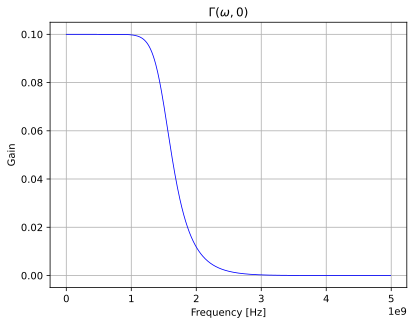

In [595]:
def butter_lowpass(cutoff, fs, order=5):
    nyquist = 0.5 * fs
    normal_cutoff = cutoff / nyquist
    b, a = butter(order, normal_cutoff, btype='low', analog=False)
    return b, a

# Filter parameters
fs = 100.0 * 1e8 # Sample rate (Hz)
cutoff_freq = 15.0 * 1e8 # Desired cutoff frequency (Hz)
order = 6  # Filter order

# Compute the frequency response of the filter
b, a = butter_lowpass(cutoff_freq, fs, order=order)
b = (1e-1)*b
w, h = freqz(b, a, fs=fs)

# Plot the frequency response
plt.figure()
plt.plot(w, abs(h), color = "b")
plt.xlabel('Frequency [Hz]')
plt.ylabel('Gain')
plt.title("$\Gamma(\omega, 0)$")
plt.grid(True)
plt.show()

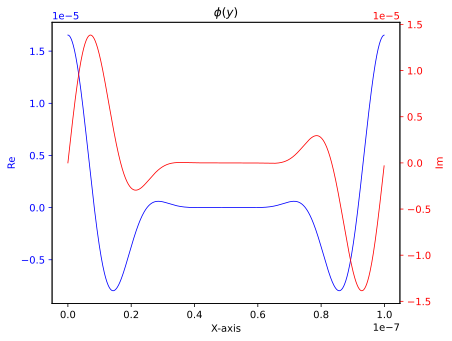

In [596]:
# Compute the inverse Fourier transform of the filter coefficients
N = 1000  # Number of points for the time-domain representation
phi = (np.fft.ifft(np.concatenate((b, np.zeros(N - len(b))))))

# Generate the time array for the filter representation
y = np.arange(0, N) / fs
y_arr = y

fig, ax1 = plt.subplots()

ax1.plot(y, np.real(phi), 'b-')
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Re', color='b')
ax1.tick_params('y', colors='b')
ax2 = ax1.twinx()

ax2.plot(y, np.imag(phi), 'r-')
ax2.set_ylabel('Im', color='r')
ax2.tick_params('y', colors='r')
fig.tight_layout()
plt.title("$\phi(y)$")

plt.show()

In [597]:
# x calculations
x = np.linspace(0, L, num=N)
phi_end_pt = (yL*N/L)

I = scipy.integrate.cumtrapz(phi)
I = np.concatenate((np.array([I[0]]), I), axis=0)

eps_x = 1/( 1/(start*eps0) - 2*I )

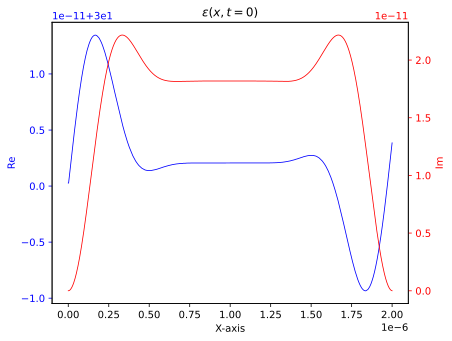

In [598]:
fig, ax1 = plt.subplots()

ax1.plot(x, np.real(eps_x/eps0), 'b-')
ax1.set_xlabel('X-axis')
ax1.set_ylabel('Re', color='b')
ax1.tick_params('y', colors='b')

ax2 = ax1.twinx()

ax2.plot(x, np.imag(eps_x/eps0), 'r-')
ax2.set_ylabel('Im', color='r')
ax2.tick_params('y', colors='r')
fig.tight_layout()
plt.title("$\epsilon(x, t=0)$")

plt.show()

## Temporal Synthesis

**Ricatti**: $\Gamma'(\omega, t)-j\omega \epsilon(t)\Gamma(\omega, t)+\frac{\epsilon'(t)}{2\epsilon(t)}(1-\Gamma^2(\omega, t))=0$

**Approximation**: $1-\Gamma^2(\omega, t)\approx 1$

$$
\Gamma'(\omega, t)-j\omega \epsilon(t)\Gamma(\omega, t)+\frac{\epsilon'(t)}{2\epsilon(t)}=0
$$

Try solving for $\Gamma(\omega, t)$

First order ODE in $x$ with $I(\omega, t)=e^{-\int_0^t j\omega\epsilon(u)du}$

$$
\Gamma'(\omega, t)I(\omega, t)-j\omega\epsilon(t)\Gamma(\omega, t)I(\omega, t)=-\frac{\epsilon'(t)}{2\epsilon(t)}I(\omega, t)\\

\Gamma'(\omega, t)I(\omega, t)+\Gamma(\omega, t)I'(\omega, t)=-\frac{\epsilon'(t)}{2\epsilon(t)}I(\omega, t)\\

\int_0^{\tau}d\Gamma(\omega, t)I(\omega, t)=-\int_0^\tau\frac{\epsilon'(t)}{2\epsilon(t)}I(\omega, t)dt

$$

Assuming matched load 

$$
\Gamma(\omega, \tau)I(\omega, \tau)-\Gamma(\omega, 0)I(\omega, 0)=-\int_0^\tau\frac{\epsilon'(t)}{2\epsilon(t)}e^{-\int_0^tj\omega\epsilon(u)du}dt
$$

**Approximation**: After a long time at high frequency, we have $I(\omega, t)=e^{-\int_0^tj\omega \epsilon(u)du}\to0$

$$
\Gamma(\omega, 0)I(\omega, 0)=\int_0^\tau\frac{\epsilon'(t)}{2\epsilon(t)}e^{-\int_0^tj\omega\epsilon(u)du}dt
$$

**Substitution: $y(t)=\int_0^t\epsilon(u)du$**

$$
\Gamma(\omega, 0)=\int_0^{\tau}\frac{\epsilon'(t(y))}{2\epsilon^2(t(y))}e^{-j\omega y}dy
$$

Denote 

$$
\phi(y)=\frac{\epsilon'(y)}{2\epsilon^2(y)}\times (u(t-\tau)-u(t))\\

\Gamma(\omega, 0)=\mathcal F[\phi(y)]
$$

Thus, instead of taking about $\Gamma(\omega, 0)$, we talk about $\phi(y)$

We solve for 

$$
\frac{y''}{2(y')^2}=\phi(y), y(0)=0, y'(0)=\epsilon(0)
$$

$$\int_0^{\epsilon(y)}\frac{d\epsilon}{2\epsilon^2(y)} = \int_0^y\phi(y)dy$$  

$$\epsilon(y)=\frac{1}{\frac{1}{\epsilon(0)}-2\int_0^y\phi(y)dy}$$  


$$\epsilon(x)=\frac{1}{\frac{1}{\epsilon(0)}-2\int_0^x\phi(y)dy}$$

In [599]:
# solve for t

T = 100000
t = np.linspace(0, T, num=N)

eps_tx = np.zeros((N, N), dtype=complex)

for i in range(0, N):
    I = scipy.integrate.cumtrapz(phi)
    I = np.concatenate((np.array([I[0]]), I), axis=0)

    eps_t_curr = 1/( 1/(eps_x[i]) - 2*I )
    eps_tx[i, :] = eps_t_curr
    

In [600]:
pd.DataFrame(eps_tx/eps0)

,0,1,2,3,4,5,6,7,8,9,...,990,991,992,993,994,995,996,997,998,999
0,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,...,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j
1,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,...,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j
2,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,...,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j
3,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,...,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j
4,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,...,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,...,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j
996,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,...,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j
997,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,...,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j
998,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,...,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j,30.0+0.0j


In [601]:
X, Y = np.meshgrid(t, x)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface with 'viridis' colormap
ax.plot_surface(X, Y, np.real(eps_tx), cmap='plasma')

# Set labels and title
ax.set_xlabel('t')
ax.set_ylabel('x')
ax.set_zlabel('Real Part')
ax.set_title('$Re\ \epsilon(x, t)$')

# Set the color of the axes to white
ax.xaxis.pane.set_color('white')
ax.yaxis.pane.set_color('white')
ax.zaxis.pane.set_color('white')

# Show the plot
plt.show()

In [602]:
X, Y = np.meshgrid(t, x)

fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')

# Plot the surface with 'viridis' colormap
ax.plot_surface(X, Y, np.imag(eps_tx), cmap='plasma')

# Set labels and title
ax.set_xlabel('t')
ax.set_ylabel('x')
ax.set_zlabel('Imag Part')
ax.set_title('$Im\ \epsilon(x, t)$')

# Set the color of the axes to white
ax.xaxis.pane.set_color('white')
ax.yaxis.pane.set_color('white')
ax.zaxis.pane.set_color('white')

# Show the plot
plt.show()